# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

when I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation


## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's problably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 differents classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).


In [3]:
# Unzip the uploaded data into Google Drive
#!unzip "drive/My Drive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision/"

### Get our workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [39]:
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.19.0
TF Hub version: 0.16.1
GPU available (YESSSS!!!!!)


## Getting our data ready (turning into Tensors)
With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.


In [9]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [10]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

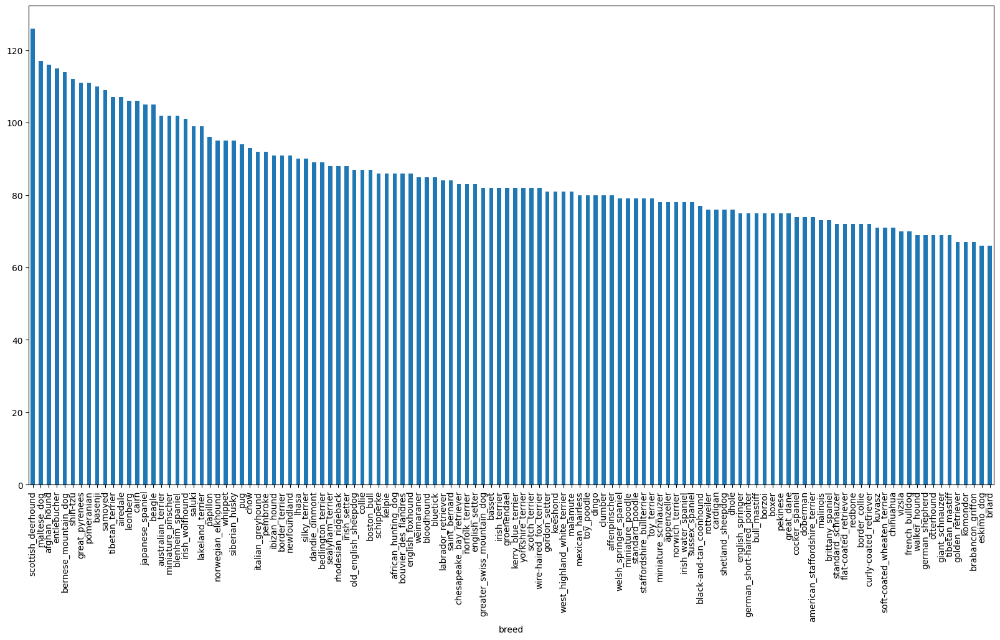

In [11]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [12]:
labels_csv["breed"].value_counts().median()

82.0

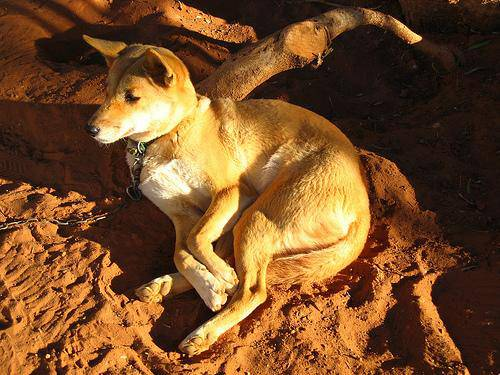

In [13]:
# Let's view an image
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels
Let's get a list of all our images file pathnames.

In [14]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [15]:
# Create pathnames from image ID's
filenames = ["drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [17]:
labels_csv["breed"][9000]

'tibetan_mastiff'

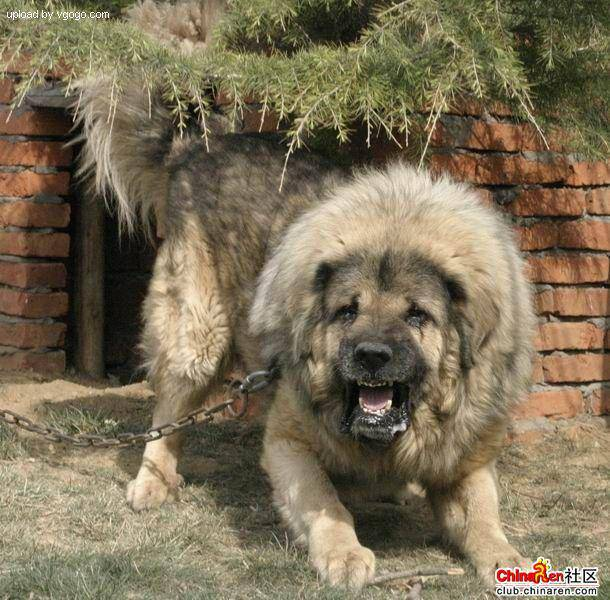

In [16]:
Image(filenames[9000])


In [18]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("Filenames match the actual amount of files!!!  Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match the actual amount of files!!!  Proceed.


Since we've now got our training image filepaths in a list, let's prepare our labels.


In [19]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels =  np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [16]:
len(labels)

10222

In [20]:
# See if numbers of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [21]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [19]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [21]:
len(boolean_labels)

10222

In [22]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [23]:
# Setup X & y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [24]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min: 1000, max: 10000, step: 1000}

In [25]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)


(800, 800, 200, 200)

In [26]:
# Let's have a geez at the training data
X_train[:2], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, F

## Preprocessing Images (turning images into Tensors)

To proprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image`to be a shape of (224, 224)
5. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [27]:
# Convert an image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [28]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

In [29]:
# Turn image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the `image`to be a shape of (224, 224)
6. Return the modified `image`

In [41]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colours channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image



## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do 32 (this is the batch size) images at a time (you can manually adust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: `(image, label)`.




In [56]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [32]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples to Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches!

In [37]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))
    # Create (image, label) tuples (this also turns the image into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [34]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [35]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data in now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [36]:
import matplotlib.pyplot as plt
# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop throught 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


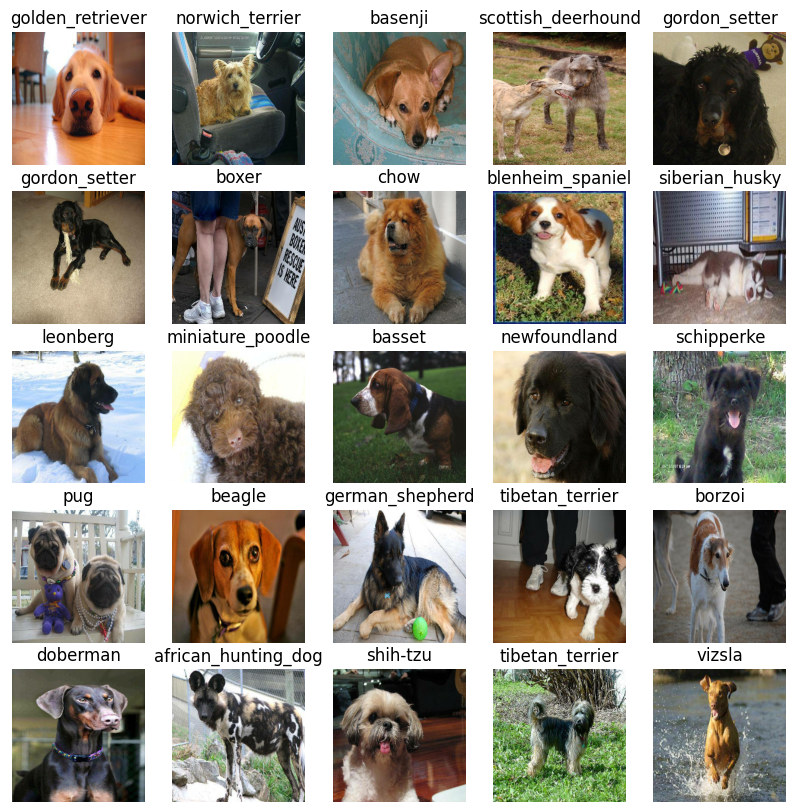

In [37]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

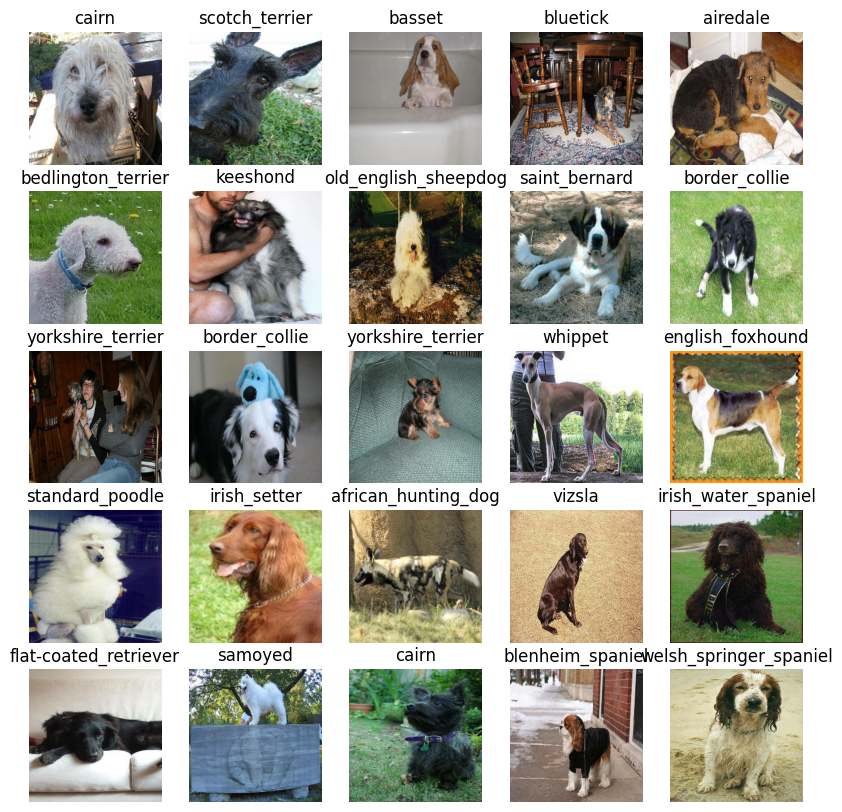

In [38]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The ouput shape (images labels, in the form of Tensors) of our model.
* The URL of the model we want to use.


In [46]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Define the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of this steps can be found here: https://www.tensorflow.org/guide/keras


In [47]:
class HubKerasLayerWrapper(tf.keras.layers.Layer):
  def __init__(self, hub_url, trainable=False, **kwargs):
    super(HubKerasLayerWrapper, self).__init__(**kwargs)
    self.hub_layer = hub.KerasLayer(hub_url, trainable=trainable)

  def call(self, inputs):
    return self.hub_layer(inputs)

# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
      tf.keras.Input(shape=input_shape[1:]), # Explicitly define input shape
      HubKerasLayerWrapper(model_url, trainable=False), # HubKerasLayerWrapper will now infer input_shape
      tf.keras.layers.Dense(
          units=output_shape,
          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  return model

In [41]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ hub_keras_layer_wrapper         │ (None, 1001)           │             0 │
│ (HubKerasLayerWrapper)          │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       120,240 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

## Creating callbacks

Callbacks are helpers functions a model can use during training to do things such as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our model progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension. ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function. ✅
3. Visualize our models training logs with `%tensorboard` magic function (we'll do this after model training).

In [42]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [43]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  log_dir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(log_dir=log_dir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [44]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                  patience=3)

### Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [45]:
NUM_EPOCHS = 100 #@param {type: "slider", min: 10, max: 100, step: 10}

In [46]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSSS!!!!!)


Let's create a function which trains a model.

* Create a model using `create_model`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [47]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the traines version.
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq= 1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model


In [48]:
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 265s 10s/step - accuracy: 0.0584 - loss: 5.0891 - val_accuracy: 0.2050 - val_loss: 3.4462
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 208ms/step - accuracy: 0.6258 - loss: 1.9451 - val_accuracy: 0.5100 - val_loss: 2.1689
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 208ms/step - accuracy: 0.9165 - loss: 0.6084 - val_accuracy: 0.5800 - val_loss: 1.7189
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - accuracy: 0.9814 - loss: 0.2586 - val_accuracy: 0.5900 - val_loss: 1.5304
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 212ms/step - accuracy: 0.9951 - loss: 0.1633 - val_accuracy: 0.6150 - val_loss: 1.4533
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 181ms/step - accuracy: 0.9989 - loss: 0.1031 - val_accuracy: 0.6200 - val_loss: 1.4060
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 170ms/step - accuracy: 1.0000 - loss: 0.0761 - val_accuracy: 0.6400 - val_lo

**Question:** It looks like our model might be overfitting (getting far better results on the training set than the validation set), what are some ways to prevent model overfitting? Hint: this may involve searching something like "ways to prevent overfitting in a deep learning model?".

**Note:** Overfitting to begin with is a good thing. It means our model is learning something.

#### Checking the TensorBoard logs
Now our model has been trained, we can make its performance visual by checking the TensorBoard logs.

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and viualize its contents.

In [49]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

Thanks to our `early_stopping` callback, the model stopped training after 26 or so epochs (in my case, yours might be slightly different). This is because the validation accuracy failed to improve for 3 epochs.

But the good new is, we can definitely see our model is learning something. The validation accuracy got to 65% in only a few minutes.

This means, if we were to scale up the number of images, hopefully we'd see the accuracy increase.

## Making and evaluating predictions using a trained model

Before we scale up and train on more data, let's see some other ways we can evaluate our model. Because although accuracy is a pretty good indicator of how our model is doing, it would be even better if we could could see it in action.

Making predictions with a trained model is as calling `predict()` on it and passing it data in the same format the model was trained on.

In [50]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 698ms/step


array([[2.38534948e-03, 7.52202250e-05, 1.50117930e-03, ...,
        5.71893761e-04, 1.44222986e-05, 2.67322594e-03],
       [6.49917405e-03, 6.93445501e-04, 7.48921232e-03, ...,
        1.14824776e-04, 1.09644537e-03, 2.66909134e-04],
       [1.88756443e-04, 1.27728737e-04, 6.59210273e-05, ...,
        1.15110457e-03, 9.83802485e-04, 2.75707734e-03],
       ...,
       [3.99684213e-05, 1.14460301e-04, 2.40418492e-04, ...,
        2.70144752e-04, 4.00274148e-04, 1.61759002e-04],
       [7.54881511e-03, 2.11452818e-04, 1.29184817e-04, ...,
        2.85710645e-04, 8.85705886e-05, 1.01758568e-02],
       [1.56675946e-04, 3.93387563e-05, 6.81093603e-04, ...,
        1.89594820e-03, 3.12577235e-04, 5.41411609e-05]], dtype=float32)

In [51]:
# Check the shape of predictions
predictions.shape

(200, 120)

Making predictions with our model returns an array with a different value for each label.

In this case, making predictions on the validation data (200 images) returns an array (`predictions`) of arrays, each containing 120 different values (one for each unique dog breed).

These different values are the probabilities or the likelihood the model has predicted a certain image being a certain breed of dog. The higher the value, the more likely the model thinks a given image is a specific breed of dog.

Let's see how we'd convert an array of probabilities into an actual label.

In [52]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[2.3853495e-03 7.5220225e-05 1.5011793e-03 2.0990617e-04 1.0032478e-03
 6.8015725e-05 1.6599886e-02 4.9946341e-04 6.8435597e-04 5.7041080e-04
 3.6947062e-04 2.7527186e-04 4.4061814e-04 2.5181880e-05 2.7753747e-04
 9.5939002e-04 1.6984515e-05 1.2388812e-01 2.7605554e-05 3.7342976e-05
 3.0569357e-04 2.0695233e-04 7.8451121e-06 1.2596170e-03 1.7858398e-05
 8.0394791e-05 3.0756748e-01 3.6344116e-04 5.4594275e-04 4.0768279e-04
 1.4381309e-04 3.5089831e-04 3.3417952e-04 1.0020047e-04 1.3463391e-04
 2.8889570e-02 4.9481736e-05 5.0363259e-04 1.8032233e-04 1.5115975e-04
 1.0490401e-03 5.8880389e-05 3.1672993e-05 9.5232943e-05 5.1070470e-05
 1.0976496e-04 5.6451208e-05 1.3011476e-04 7.8720663e-04 2.0951427e-04
 5.4086128e-04 7.8111785e-05 2.4015490e-04 9.1309390e-05 6.0618775e-05
 3.0505813e-05 2.3809155e-04 6.8327286e-03 2.4931860e-04 6.2033553e-02
 5.4055318e-04 9.8060125e-05 1.0242740e-02 3.6884023e-05 1.3980084e-03
 9.0939570e-03 4.4683293e-05 6.4319953e-05 4.2958967e-03 8.7672975e-05
 3.183

Having this information is great but it would be even better if we could compare a prediction to its true label and original image.

To help us, let's first build a little function to convert prediction probabilities into predicted labels.

**Note:** Prediction probabilities are also known as confidence levels.

In [59]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]



In [ ]:
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

Wonderful! Now we've got a list of all different predictions our model has made, we'll do the same for the validation images and validation labels.

Remember, the model hasn't trained on the validation data, during the `fit()` function, it only used the validation data to evaluate itself. So we can use the validation images to visually compare our models predictions with the validation labels.

Since our validation data (`val_data`) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using [`unbatch()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#unbatch)) and then turn it into an iterator using [`as_numpy_iterator()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#as_numpy_iterator).

Let's make a small function to do so.

In [54]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Nailed it!

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make these all a bit more visualize.

More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

The first function we'll create will:
* Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [55]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

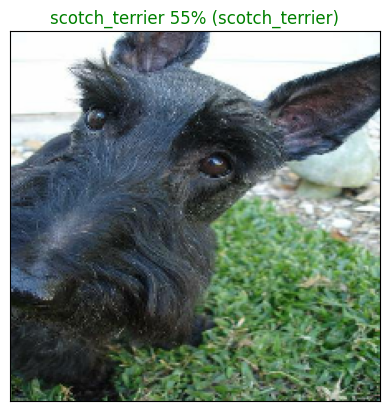

In [56]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

Nice! Making functions to help visual your models results are really helpful in understanding how your model is doing.

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:
* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using `get_pred_label()`.
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [57]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

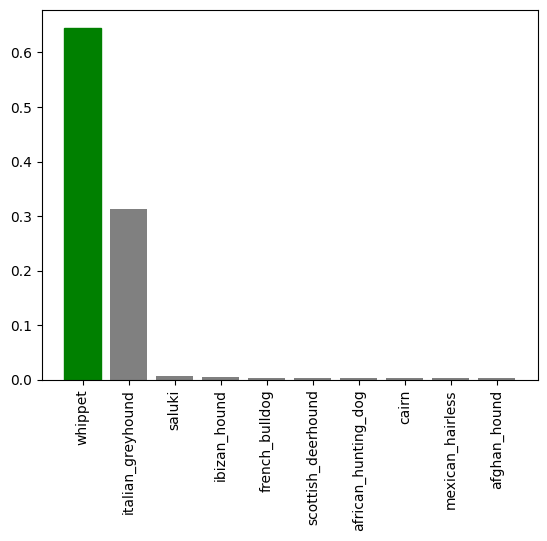

In [58]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=13)

Wonderful! Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

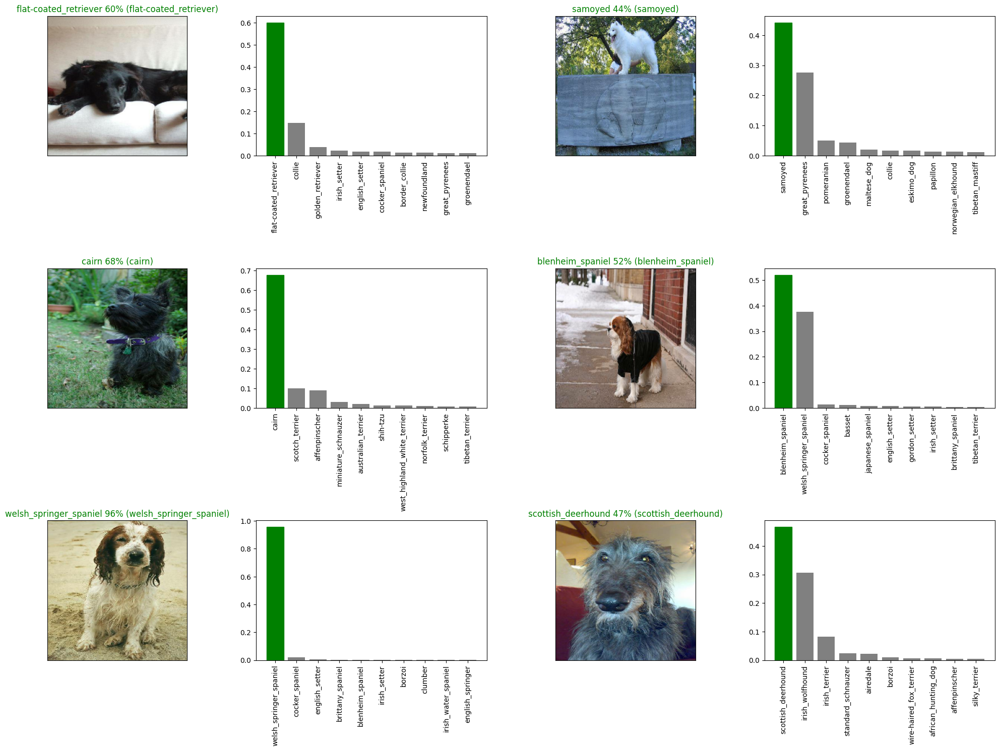

In [59]:
# Let's check a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloading a trained model


In [60]:
# Create a function to save a model
def save_model(model, suffix):
  """
  Saves a given model in a models directory and appends a prefix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


In [44]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading a model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"HubKerasLayerWrapper":HubKerasLayerWrapper})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [62]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20260213-17221771003351-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20260213-17221771003351-1000-images-mobilenetv2-Adam.h5'

In [63]:
# Load a trained model
loaded_1000_image_model = load_model("drive/My Drive/Dog Vision/models/20260213-08061770970006-1000-images-mobilenetv2-Adam.h5")

Loading a model from: drive/My Drive/Dog Vision/models/20260213-08061770970006-1000-images-mobilenetv2-Adam.h5


In [64]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - accuracy: 0.6800 - loss: 1.2364


[1.3229172229766846, 0.6499999761581421]

In [65]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 825ms/step - accuracy: 0.6536 - loss: 1.2636


[1.3553141355514526, 0.6399999856948853]

## Training a big dog model (on the full data)

In [66]:
len(X), len(y)

(10222, 10222)

In [67]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [68]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [69]:
# Create a model for full model
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [70]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [71]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping]
               )
#

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 63s 172ms/step - accuracy: 0.4916 - loss: 2.3378
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 66s 133ms/step - accuracy: 0.8852 - loss: 0.3962
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - accuracy: 0.9396 - loss: 0.2285
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 133ms/step - accuracy: 0.9670 - loss: 0.1429
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 134ms/step - accuracy: 0.9809 - loss: 0.0974
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 134ms/step - accuracy: 0.9875 - loss: 0.0749
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - accuracy: 0.9911 - loss: 0.0573
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - accuracy: 0.9956 - loss: 0.0418
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - accuracy: 0.9972 - loss: 0.0370
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - accuracy: 0.9963 - loss: 0.0307
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - accuracy: 0.9979 - loss: 0.0272
Epoch 12

In [72]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20260213-17361771004215-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20260213-17361771004215-full-image-set-mobilenetv2-Adam.h5'

In [48]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20260213-14381770993539-full-image-set-mobilenetv2-Adam.h5')

Loading a model from: drive/My Drive/Dog Vision/models/20260213-14381770993539-full-image-set-mobilenetv2-Adam.h5


In [74]:
len(X)

10222

## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it in the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test images filenames. ✅
* Convert the filnames into test data batches using `create_data_batches()` and setting the `test_data`parameter to `True` (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model.


In [24]:
# Load test images filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e41802f671c437c10e843400dcea40fb.jpg',
 'drive/MyDrive/Dog Vision/test/ddc0134def0da0472e55271da8b57c44.jpg',
 'drive/MyDrive/Dog Vision/test/df47feaaf3dfb33cf712cccdddc8060e.jpg',
 'drive/MyDrive/Dog Vision/test/e24877545b682257ca77ae600df1fe37.jpg',
 'drive/MyDrive/Dog Vision/test/e66a91249a4979a86db48e5c64b81a88.jpg',
 'drive/MyDrive/Dog Vision/test/dfe03aa0ae066e09cdda6e7f6e08390a.jpg',
 'drive/MyDrive/Dog Vision/test/e66e1f3be08028cc17ea788657e014fa.jpg',
 'drive/MyDrive/Dog Vision/test/e3c97ed588b32f49c7aae65cf91f17ba.jpg',
 'drive/MyDrive/Dog Vision/test/e14211c7b8cba3e46d5802291b765be7.jpg',
 'drive/MyDrive/Dog Vision/test/e2b6d4957b62934bd831c3a1b65e2ebb.jpg']

In [76]:
len(test_filenames)

10357

In [77]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about ~1hr).

In [78]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 288s 833ms/step


In [79]:
test_predictions

array([[9.7800629e-11, 3.8126137e-13, 5.9283682e-11, ..., 6.0954866e-11,
        6.0021642e-07, 1.7423752e-13],
       [6.6772282e-11, 1.4596159e-07, 5.2443768e-11, ..., 3.4709313e-08,
        4.7668610e-07, 2.3624984e-09],
       [2.2843082e-07, 3.7186249e-10, 1.4082270e-08, ..., 7.7622790e-06,
        5.6680893e-03, 3.3187268e-07],
       ...,
       [2.0419614e-06, 2.0339336e-07, 4.7037594e-07, ..., 5.5231053e-06,
        4.0246124e-07, 2.2992158e-04],
       [4.2501993e-09, 1.8220087e-08, 4.5704125e-09, ..., 3.7770778e-07,
        5.7625559e-08, 2.2876519e-07],
       [4.3479082e-07, 5.8518781e-05, 1.3484544e-08, ..., 4.6843595e-11,
        5.3478832e-10, 1.9205353e-09]], dtype=float32)

In [83]:
# save predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [3]:
# Load predictions (Numpy array) from csv file
import numpy as np
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [4]:
test_predictions[:10]

array([[9.78006287e-11, 3.81261374e-13, 5.92836821e-11, ...,
        6.09548662e-11, 6.00216424e-07, 1.74237523e-13],
       [6.67722821e-11, 1.45961593e-07, 5.24437681e-11, ...,
        3.47093128e-08, 4.76686097e-07, 2.36249842e-09],
       [2.28430821e-07, 3.71862485e-10, 1.40822696e-08, ...,
        7.76227898e-06, 5.66808926e-03, 3.31872684e-07],
       ...,
       [1.64369223e-04, 2.67428024e-10, 8.43757703e-11, ...,
        7.64593770e-12, 2.87789836e-09, 1.03038404e-10],
       [4.03825062e-09, 1.45754117e-10, 2.03034798e-08, ...,
        2.50920706e-08, 2.53393715e-08, 1.06680147e-06],
       [1.70337685e-11, 1.01319229e-08, 1.34406817e-11, ...,
        1.44728873e-09, 2.37441438e-11, 7.54005025e-10]])

In [5]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [30]:
import pandas as pd
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [31]:
# Append test image ID's to preditions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e41802f671c437c10e843400dcea40fb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ddc0134def0da0472e55271da8b57c44,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,df47feaaf3dfb33cf712cccdddc8060e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e24877545b682257ca77ae600df1fe37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e66a91249a4979a86db48e5c64b81a88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e41802f671c437c10e843400dcea40fb,9.780063e-11,3.812614e-13,5.928368e-11,1.908362e-12,7.646000e-09,8.342924e-08,1.998150e-09,1.373491e-05,2.330222e-09,...,1.195347e-11,1.455346e-09,2.850605e-11,1.519379e-09,9.240360e-12,3.032943e-07,1.585860e-10,6.095487e-11,6.002164e-07,1.742375e-13
1,ddc0134def0da0472e55271da8b57c44,6.677228e-11,1.459616e-07,5.244377e-11,1.195982e-10,2.237183e-12,7.878705e-11,2.572480e-11,1.767226e-10,1.286427e-13,...,6.539134e-10,3.153017e-11,3.217663e-12,8.910454e-12,2.362554e-12,4.060339e-11,1.183515e-09,3.470931e-08,4.766861e-07,2.362498e-09
2,df47feaaf3dfb33cf712cccdddc8060e,2.284308e-07,3.718625e-10,1.408227e-08,1.934330e-10,7.289973e-09,2.892541e-13,1.249908e-07,1.428137e-05,6.902188e-10,...,1.479458e-09,3.273293e-06,8.056215e-11,4.660391e-08,5.402277e-10,4.989019e-08,4.764498e-06,7.762279e-06,5.668089e-03,3.318727e-07
3,e24877545b682257ca77ae600df1fe37,2.406038e-14,4.952019e-16,3.065954e-12,3.039823e-11,1.567558e-16,1.264020e-10,2.147620e-11,1.537940e-12,3.908669e-15,...,2.406617e-10,7.168380e-07,8.036964e-14,6.502698e-18,1.856300e-11,3.897354e-15,3.723692e-12,1.583598e-14,2.629906e-13,1.979137e-11
4,e66a91249a4979a86db48e5c64b81a88,3.181250e-09,1.302750e-07,1.963887e-11,1.506169e-15,1.505454e-12,2.007077e-10,1.768696e-12,1.017689e-12,3.279453e-14,...,2.162398e-12,3.205816e-09,2.446354e-11,1.434950e-09,2.269656e-12,3.592648e-11,1.624965e-10,4.261016e-07,2.788457e-08,2.835808e-11


In [33]:
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv", index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths or our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [50]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/My Drive/Dog Vision/my-dog-photos/Border_Collie_dog.jpg']

In [51]:
# Turn custom images into datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [52]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step


array([[6.04409023e-10, 3.07562795e-11, 1.04472299e-10, 2.56359778e-09,
        2.50641605e-08, 2.60693832e-05, 1.04250619e-09, 3.65204187e-08,
        4.55966699e-13, 1.31500075e-10, 2.60115762e-10, 3.58940997e-06,
        5.42708212e-10, 5.97943986e-11, 6.70384668e-12, 8.56617266e-09,
        8.64806175e-01, 2.53987942e-10, 9.40597076e-08, 4.02055500e-09,
        5.70328160e-11, 2.05802728e-13, 1.25945261e-11, 3.49693718e-10,
        1.23951416e-09, 1.31281791e-10, 8.18825910e-12, 2.80424388e-06,
        1.09347892e-10, 2.09797824e-09, 6.04008310e-09, 3.66479867e-11,
        7.28614391e-10, 1.35149613e-01, 7.67684860e-10, 1.83039431e-10,
        3.17428506e-09, 4.74149164e-10, 1.34545861e-10, 9.67440919e-11,
        6.47686260e-09, 5.17471221e-08, 1.09861631e-08, 7.23095006e-09,
        1.08679465e-07, 6.53399166e-12, 2.67952438e-09, 2.83443356e-11,
        1.32173730e-10, 9.59060387e-09, 8.09641065e-09, 1.57217850e-10,
        2.70366982e-08, 5.41222789e-10, 1.65837335e-07, 5.644413

In [54]:
custom_preds.shape

(1, 120)

In [60]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['border_collie']

In [61]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

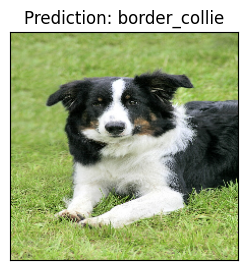

In [64]:
# Check custom image predictions
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(f"Prediction: {custom_pred_labels[i]}")
  plt.imshow(image)
  plt.show()
